<a href="https://colab.research.google.com/github/laume/faces/blob/master/faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aligned Face Dataset For Face Recognition

https://www.kaggle.com/frules11/pins-face-recognition

## Prepare environment

### Setup Kaggle variables:

In [120]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [0]:
SETUP = True

In [0]:
KAGGLE = True
DOWNLOAD_DATA = True
COMPETITION = 'kaggle datasets download -d frules11/pins-face-recognition'
DATA_DIR = 'data/faces'
UNARCHIVE_DATA = False

### Install libraries and perform setup

In [4]:
if SETUP:
    !pip install --upgrade --quiet dlai
    !pip install -q -U toai

     |████████████████████████████████| 380.8MB 45kB/s 
     |████████████████████████████████| 450kB 26.2MB/s 
     |████████████████████████████████| 3.8MB 42.0MB/s 
ERROR: tensorflow 1.15.0 has requirement tensorboard<1.16.0,>=1.15.0, but you'll have tensorboard 2.0.0 which is incompatible.
ERROR: tensorflow 1.15.0 has requirement tensorflow-estimator==1.15.1, but you'll have tensorflow-estimator 2.0.1 which is incompatible.
     |████████████████████████████████| 153kB 7.8MB/s 
     |████████████████████████████████| 81kB 10.4MB/s 
     |████████████████████████████████| 296kB 45.1MB/s 
     |████████████████████████████████| 61kB 8.4MB/s 


In [5]:
import dlai
from dlai.imports import *
print('toai version', __import__('toai').__version__)
print(f'dlai version: {dlai.__version__}, tf version: {tf.__version__}')

toai version 0.1.30
dlai version: 0.0.16, tf version: 2.0.0


In [6]:
!pip install -q tensorflow_addons

     |████████████████████████████████| 1.8MB 4.9MB/s 


In [0]:
%load_ext autoreload
%autoreload 2

In [0]:
%matplotlib inline

In [0]:
%matplotlib inline

In [9]:
from toai.imports import *
from toai.data import Dataset, DataContainer
from toai.metrics import sparse_top_2_categorical_accuracy
from toai.image import (
    ImageLearner,
    ImageAugmentor,
    ImageDataset,
    ImageParser,
    ImageResizer,
    LearningRateFinder,
    ImageTrainingCycle,
    ImageTrainer,
)
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/toai/imports.py:68: UserWarning: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
  warnings.warn(str(error))


In [0]:
if KAGGLE:
    setup_kaggle()

In [0]:
if DOWNLOAD_DATA:
    download_kaggle_data(COMPETITION, DATA_DIR)

In [12]:
!ls {DATA_DIR}/PINS | wc -l

100


Make DATA_DIR as a path for further use:

In [0]:
DATA_DIR = Path(DATA_DIR)
TEMP_DIR = Path("/content/gdrive/My Drive/faces/faces")

In [0]:
# TEMP_DIR.mkdir(parents=True)

## Explore the data

In [24]:
!ls -U {DATA_DIR}/PINS/'pins_Aaron Paul'| wc -l

86


In [0]:
N_CLASSES = 100
BATCH_SIZE = 32
IMG_DIMS = (150, 150, 3)

In [0]:
train_data, valid_data, test_data = ImageDataset.split(
    dataset=ImageDataset.from_subfolders(DATA_DIR/"PINS"), fracs=(0.8, 0.1, 0.1)
)

In [18]:
train_data.x

array(['data/faces/PINS/pins_Cameron Monaghan/Cameron Monaghan30.jpg',
       'data/faces/PINS/pins_Brit Marling/Brit Marling15_477.jpg',
       'data/faces/PINS/pins_Mark Ruffalo/Mark Ruffalo94.jpg', ...,
       'data/faces/PINS/pins_maria pedraza/maria pedraza158_1573.jpg',
       'data/faces/PINS/pins_millie bobby brown/millie bobby brown47.jpg',
       'data/faces/PINS/pins_Ryan Reynolds/Ryan Reynolds2.jpg'],
      dtype='<U77')

In [24]:
train_data.y

array(['pins_sean pertwee', 'pins_gal gadot face', 'pins_Willa Holland',
       ..., 'pins_grant gustin face', 'pins_Kit Harington',
       'pins_Dominic Purcell'], dtype='<U29')

In [0]:
# train_data.y = np.random.randint(100, size=len(train_data))

In [0]:
train_data = (
    train_data.dataset(batch_size=BATCH_SIZE, img_dims=IMG_DIMS, shuffle=True)
    .make_pipeline(
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3),
        ],
    )
    .preprocess()
)

In [0]:
valid_data = (
    valid_data.dataset(batch_size=BATCH_SIZE, img_dims=IMG_DIMS)
    .make_pipeline(
        label_map=train_data.label_map,
        image_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
        ],
    )
    .save_pipeline(TEMP_DIR / "pred")
    .preprocess()
)

In [0]:
test_data = (
    test_data.dataset(batch_size=BATCH_SIZE, img_dims=IMG_DIMS)
    .load_pipeline(TEMP_DIR / "pred")
    .preprocess()
)

In [0]:
data_container = DataContainer(train=train_data, validation=valid_data, test=test_data)

In [25]:
data_container.train.n_classes

100

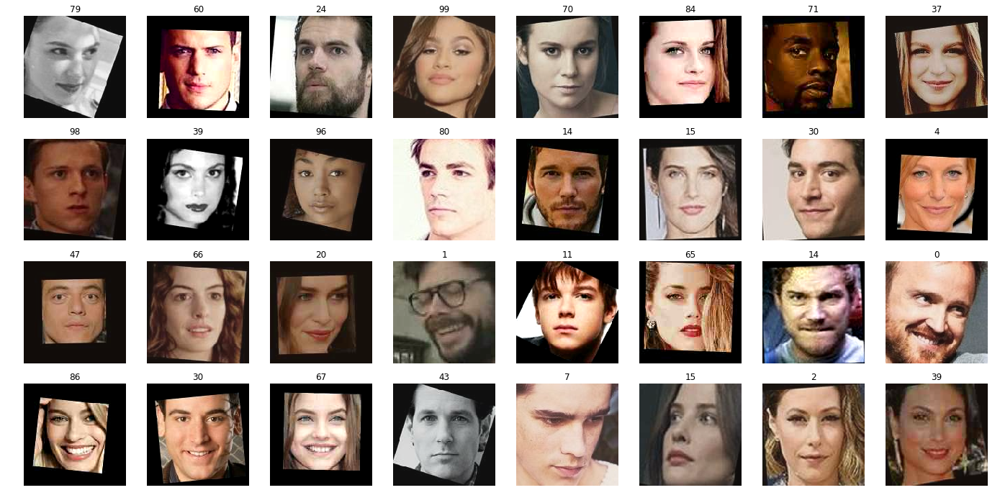

In [30]:
data_container.train.show()

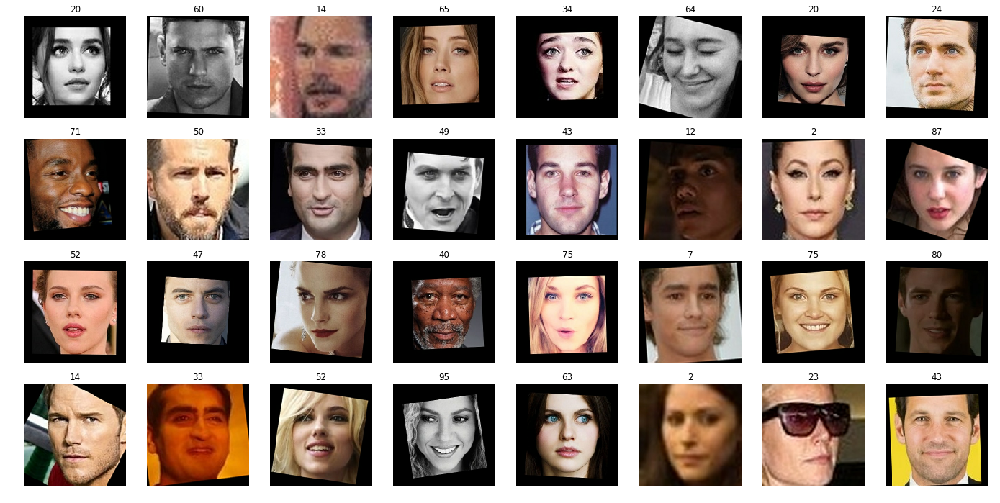

In [31]:
data_container.validation.show()

In [35]:
learner = ImageLearner(
    path=TEMP_DIR / "xception_v1",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[
        keras.metrics.sparse_categorical_accuracy,
        sparse_top_2_categorical_accuracy,
    ],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=SETUP,
)

83689472/83683744 [==============================] - 7s 0us/step


In [0]:
trainer = ImageTrainer(learner=learner, data_container=data_container)

In [0]:
cycles = [
    ImageTrainingCycle(
        n_epochs=3,
        lr=3e-4,
        optimizer=keras.optimizers.Adam,
        freeze=True,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=5, flips="horizontal"),
        ],
    ),
    ImageTrainingCycle(
        n_epochs=10,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="horizontal"),
        ],
    ),
]

In [38]:
trainer.train(cycles=cycles)

Train for 270 steps, validate for 34 steps
Epoch 1/3
270/270 [==============================] - 104s 386ms/step - loss: 5.1446 - sparse_categorical_accuracy: 0.0238 - sparse_top_2_categorical_accuracy: 0.0442 - val_loss: 4.8295 - val_sparse_categorical_accuracy: 0.0221 - val_sparse_top_2_categorical_accuracy: 0.0441
Epoch 2/3
270/270 [==============================] - 70s 260ms/step - loss: 4.5939 - sparse_categorical_accuracy: 0.0602 - sparse_top_2_categorical_accuracy: 0.1035 - val_loss: 4.8879 - val_sparse_categorical_accuracy: 0.0340 - val_sparse_top_2_categorical_accuracy: 0.0616
Epoch 3/3
270/270 [==============================] - 69s 257ms/step - loss: 4.2629 - sparse_categorical_accuracy: 0.0983 - sparse_top_2_categorical_accuracy: 0.1564 - val_loss: 5.0749 - val_sparse_categorical_accuracy: 0.0285 - val_sparse_top_2_categorical_accuracy: 0.0579
Train for 270 steps, validate for 34 steps
Epoch 1/10
270/270 [==============================] - 218s 807ms/step - loss: 4.4480 - spar

In [0]:
cycles_2 = [
    ImageTrainingCycle(
        n_epochs=5,
        lr=3e-5,
        optimizer=keras.optimizers.Adam,
        feature_pipeline=[
            ImageParser(),
            ImageResizer(img_dims=IMG_DIMS, resize="stretch"),
            ImageAugmentor(level=3, flips="horizontal"),
        ],
    ),
]

In [41]:
trainer.train(cycles=cycles_2)

Train for 270 steps, validate for 34 steps
Epoch 1/5
270/270 [==============================] - 219s 810ms/step - loss: 0.5457 - sparse_categorical_accuracy: 0.8541 - sparse_top_2_categorical_accuracy: 0.9267 - val_loss: 1.1005 - val_sparse_categorical_accuracy: 0.7169 - val_sparse_top_2_categorical_accuracy: 0.8272
Epoch 2/5
270/270 [==============================] - 188s 695ms/step - loss: 0.4079 - sparse_categorical_accuracy: 0.8926 - sparse_top_2_categorical_accuracy: 0.9549 - val_loss: 1.0661 - val_sparse_categorical_accuracy: 0.7279 - val_sparse_top_2_categorical_accuracy: 0.8244
Epoch 3/5
270/270 [==============================] - 187s 694ms/step - loss: 0.3205 - sparse_categorical_accuracy: 0.9164 - sparse_top_2_categorical_accuracy: 0.9683 - val_loss: 0.9972 - val_sparse_categorical_accuracy: 0.7463 - val_sparse_top_2_categorical_accuracy: 0.8401
Epoch 4/5
270/270 [==============================] - 186s 690ms/step - loss: 0.2452 - sparse_categorical_accuracy: 0.9407 - sparse_t

In [42]:
trainer.train(cycles=cycles_2)

Train for 270 steps, validate for 34 steps
Epoch 1/5
270/270 [==============================] - 217s 804ms/step - loss: 0.1876 - sparse_categorical_accuracy: 0.9573 - sparse_top_2_categorical_accuracy: 0.9859 - val_loss: 0.9227 - val_sparse_categorical_accuracy: 0.7730 - val_sparse_top_2_categorical_accuracy: 0.8585
Epoch 2/5
270/270 [==============================] - 186s 688ms/step - loss: 0.1498 - sparse_categorical_accuracy: 0.9667 - sparse_top_2_categorical_accuracy: 0.9907 - val_loss: 0.9003 - val_sparse_categorical_accuracy: 0.7794 - val_sparse_top_2_categorical_accuracy: 0.8539
Epoch 3/5
270/270 [==============================] - 185s 685ms/step - loss: 0.1152 - sparse_categorical_accuracy: 0.9792 - sparse_top_2_categorical_accuracy: 0.9947 - val_loss: 0.8881 - val_sparse_categorical_accuracy: 0.7794 - val_sparse_top_2_categorical_accuracy: 0.8704
Epoch 4/5
270/270 [==============================] - 183s 679ms/step - loss: 0.1063 - sparse_categorical_accuracy: 0.9792 - sparse_t

In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input, outputs=learner.concat_layer
)

In [48]:
learner.model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
def show_distances(
    dataset,
    target_index,
    similar_indices,
    distances,
    cols: int = 4,
    debug: bool = False,
):
    if cols >= len(distances) + 1:
        cols = len(distances) + 1
        rows = 1
    else:
        rows = math.ceil((len(distances) + 1) / cols)

    figsize = (3 * cols, 4 * rows) if debug else (3 * cols, 3 * rows)
    _, ax = plt.subplots(rows, cols, figsize=figsize)

    for i, (x, y, distance) in enumerate(
        zip(
            dataset.x[[target_index] + similar_indices],
            dataset.y[[target_index] + similar_indices],
            [0] + distances,
        )
    ):
        idx = (i // cols, i % cols) if rows > 1 else i % cols
        ax[idx].axis("off")
        ax[idx].imshow(Image.open(x))
        title = f"Label: {y}\nShape: {x.shape}\n" if debug else f"{y}\n{distance:.2f}"
        ax[idx].set_title(title)

In [0]:
image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline, image_paths=data_container.train.x
)

In [0]:
neighbors = sk.neighbors.NearestNeighbors(n_neighbors=11, algorithm="ball_tree").fit(
    image_embeddings
)

In [52]:
new_image_index = np.random.randint(len(data_container.train))
new_image_index

3898

In [0]:
new_image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=data_container.train.x[new_image_index : new_image_index + 1],
)

In [0]:
distances, indices = neighbors.kneighbors(new_image_embeddings)

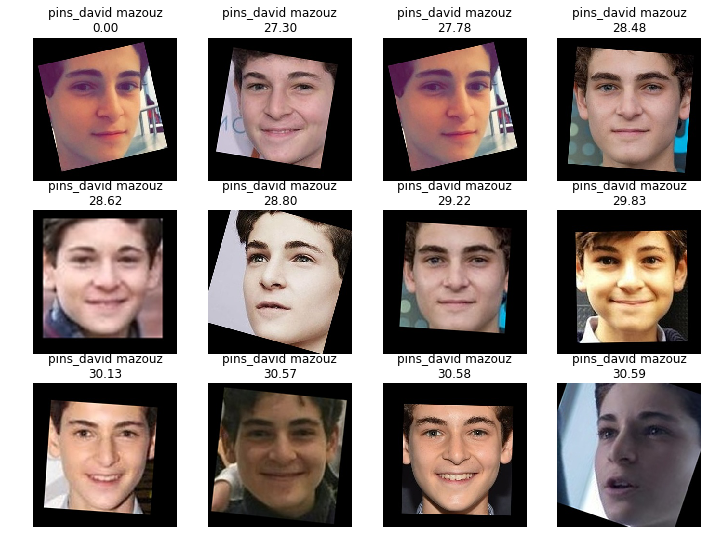

In [55]:
show_distances(
    data_container.train, new_image_index, indices[0].tolist(), distances[0].tolist()
)

In [57]:
new_image_index = np.random.randint(len(data_container.train))
new_image_index

7418

In [0]:
neighbors_2 = sk.neighbors.NearestNeighbors(n_neighbors=23, algorithm="ball_tree").fit(
    image_embeddings
)

In [0]:
new_image_embeddings_2 = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=data_container.train.x[new_image_index : new_image_index + 1],
)

In [0]:
distances, indices = neighbors_2.kneighbors(new_image_embeddings_2)

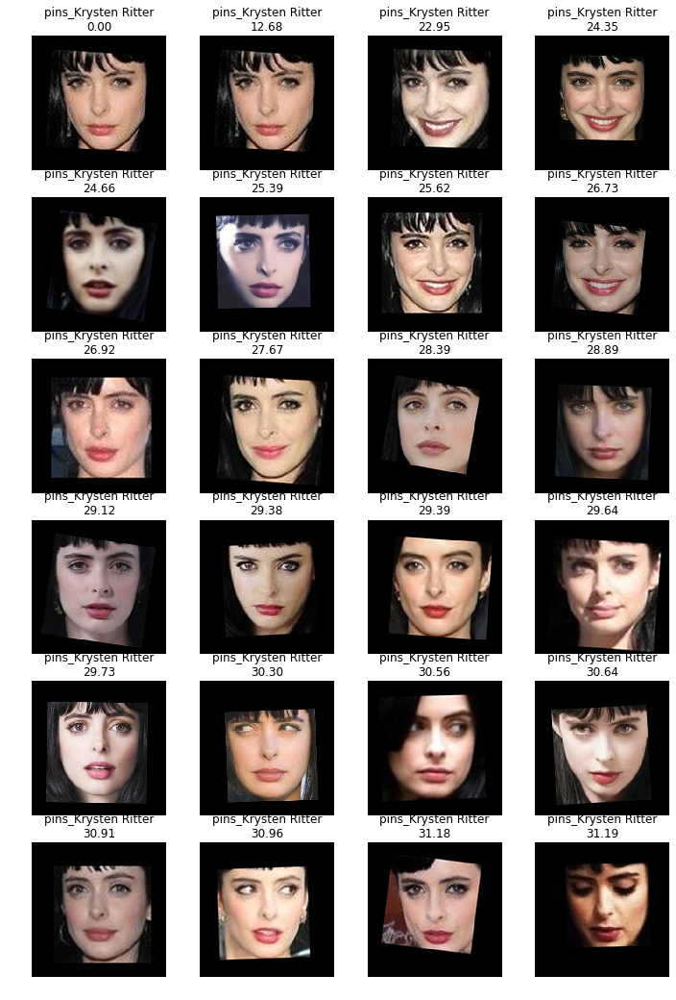

In [63]:
show_distances(
    data_container.train, new_image_index, indices[0].tolist(), distances[0].tolist()
)

In [64]:
data_container.train.x[new_image_index : new_image_index + 1]

array(['data/faces/PINS/pins_Krysten Ritter/Krysten Ritter126_104.jpg'],
      dtype='<U77')

### Try with my photo

In [0]:
my_image = '/content/gdrive/My Drive/faces/IMG_5958.jpg'

In [144]:
my_image = np.expand_dims(np.array(my_image), 0)
my_image.shape

(1,)

In [0]:
new_image_embeddings_2 = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=my_image,
)

In [0]:
distances, indices = neighbors_2.kneighbors(new_image_embeddings_2)

In [0]:
def show_distances(
    dataset,
    similar_indices,
    distances,
    cols: int = 4,
    debug: bool = False,
):
    if cols >= len(distances) + 1:
        cols = len(distances) + 1
        rows = 1
    else:
        rows = math.ceil((len(distances) + 1) / cols)

    figsize = (3 * cols, 4 * rows) if debug else (3 * cols, 3 * rows)
    _, ax = plt.subplots(rows, cols, figsize=figsize)

    for i, (x, y, distance) in enumerate(
        zip(
            dataset.x[similar_indices],
            dataset.y[similar_indices],
            [0] + distances,
        )
    ):
        idx = (i // cols, i % cols) if rows > 1 else i % cols
        ax[idx].axis("off")
        ax[idx].imshow(Image.open(x))
        title = f"Label: {y}\nShape: {x.shape}\n" if debug else f"{y}\n{distance:.2f}"
        ax[idx].set_title(title)

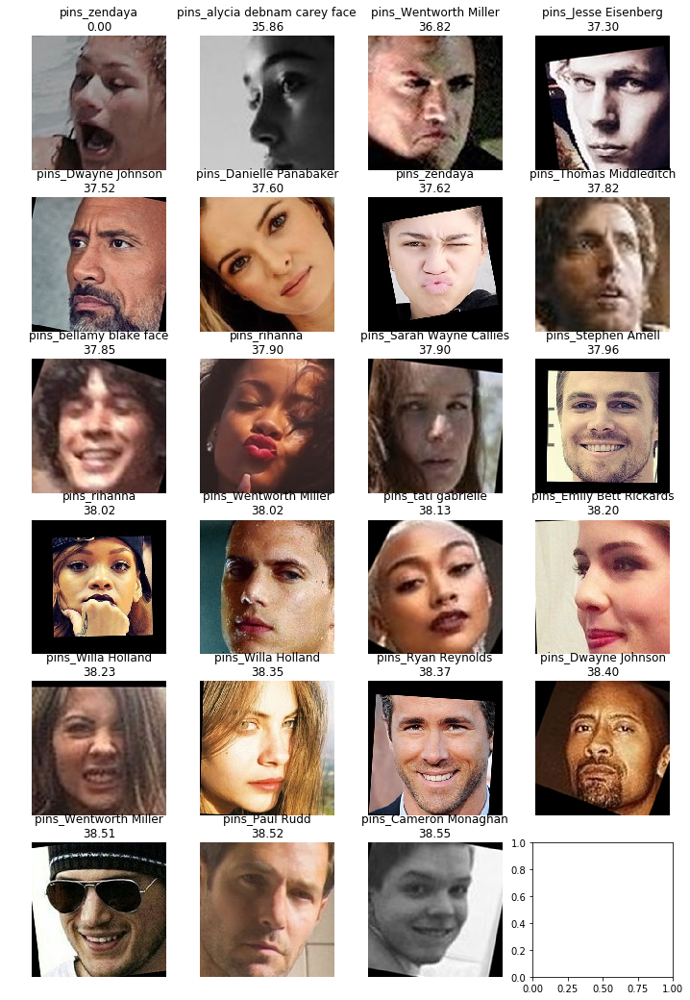

In [147]:
show_distances(
    data_container.train, indices[0].tolist(), distances[0].tolist(),
)

# TripletSemiHardLoss

In [32]:
learner = ImageLearner(
    path=TEMP_DIR / "xception_v1",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[
        keras.metrics.sparse_categorical_accuracy,
        sparse_top_2_categorical_accuracy,
    ],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=False,
    load=True,
)

83689472/83683744 [==============================] - 3s 0us/step


In [33]:
learner.model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

In [0]:
learner.loss = tfa.losses.TripletSemiHardLoss()

In [0]:
learner.stl_squeeze_layer = keras.layers.Dense(16, activation=None)

In [0]:
lambda_layer = keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))

In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=lambda_layer(
        learner.stl_squeeze_layer(learner.concat_layer)
    ),
)

In [56]:
learner.model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_4[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.compile(optimizer=keras.optimizers.Adam, lr=1e-4)

In [69]:
history = learner.model.fit(
    data_container.train.data,
    validation_data=data_container.validation.data,
    steps_per_epoch=data_container.train.steps,
    validation_steps=data_container.validation.steps,
    epochs=3,
)

Train for 270 steps, validate for 34 steps
Epoch 1/3
270/270 [==============================] - 216s 800ms/step - loss: 0.9144 - sparse_categorical_accuracy: 0.0140 - sparse_top_2_categorical_accuracy: 0.0259 - val_loss: 0.8863 - val_sparse_categorical_accuracy: 0.0202 - val_sparse_top_2_categorical_accuracy: 0.0340
Epoch 2/3
270/270 [==============================] - 180s 666ms/step - loss: 0.8905 - sparse_categorical_accuracy: 0.0146 - sparse_top_2_categorical_accuracy: 0.0284 - val_loss: 0.8882 - val_sparse_categorical_accuracy: 0.0110 - val_sparse_top_2_categorical_accuracy: 0.0368
Epoch 3/3
270/270 [==============================] - 178s 660ms/step - loss: 0.8793 - sparse_categorical_accuracy: 0.0167 - sparse_top_2_categorical_accuracy: 0.0306 - val_loss: 0.8854 - val_sparse_categorical_accuracy: 0.0083 - val_sparse_top_2_categorical_accuracy: 0.0303


In [0]:
image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline, image_paths=data_container.train.x
)

In [78]:
image_embeddings.shape

(8616, 16)

In [0]:
nbrs = sk.neighbors.NearestNeighbors(n_neighbors=19, algorithm="ball_tree").fit(
    image_embeddings
)

In [81]:
new_image_index = np.random.randint(len(data_container.train))
new_image_index

2399

In [0]:
new_image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=data_container.train.x[new_image_index : new_image_index + 1],
)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

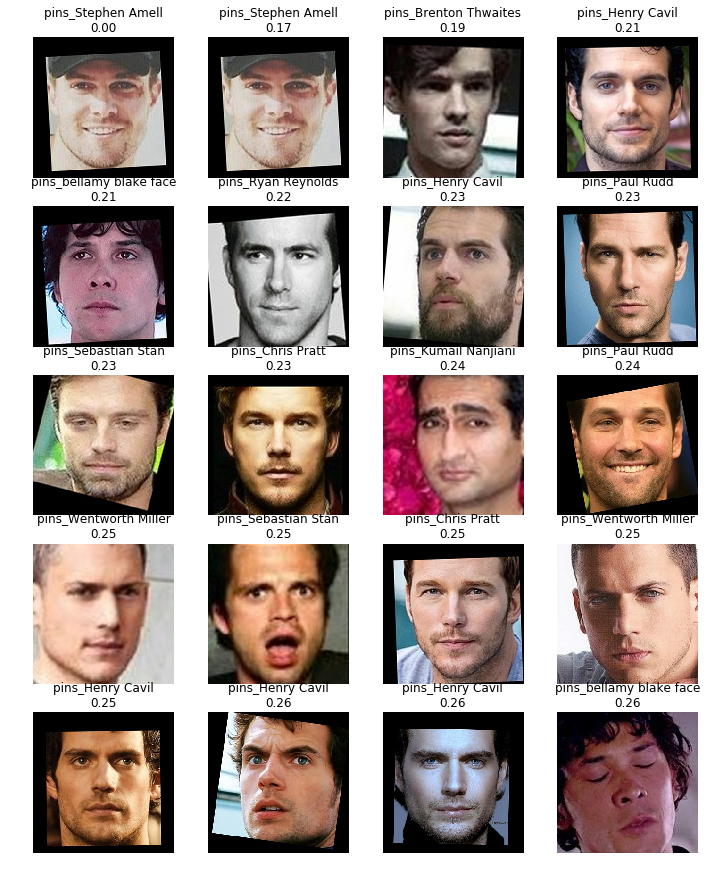

In [86]:
show_distances(
    data_container.train, new_image_index, indices[0].tolist(), distances[0].tolist()
)

## Round 2

In [0]:
IMG_DIMS = (150, 150, 3)

In [0]:
learner = ImageLearner(
    path=TEMP_DIR / "xception_v1",
    base_model=keras.applications.Xception,
    input_shape=IMG_DIMS,
    output_shape=[data_container.train.n_classes],
    activation=keras.activations.softmax,
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[
        keras.metrics.sparse_categorical_accuracy,
        sparse_top_2_categorical_accuracy,
    ],
    dropout=0.5,
    l1=3e-6,
    l2=3e-5,
    override=False,
    load=True,
)

In [37]:
learner.model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
______________________________________________________________________________________________

Squeeze layer with 32 embeddings

In [0]:
learner.squeeze_layer = keras.layers.Dense(
    32,
    activation=keras.activations.relu,
    kernel_initializer=keras.initializers.he_uniform(),
)

In [0]:
learner.output_layer = keras.layers.Dense(
    N_CLASSES, activation=keras.activations.softmax
)

In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=learner.output_layer(learner.squeeze_layer(learner.dropout_layer)),
)

In [41]:
learner.model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.compile(optimizer=keras.optimizers.Adam, lr=1e-4)

In [43]:
history = learner.model.fit(
    data_container.train.data,
    validation_data=data_container.validation.data,
    steps_per_epoch=data_container.train.steps,
    validation_steps=data_container.validation.steps,
    epochs=3,
)

Train for 270 steps, validate for 34 steps
Epoch 1/3
270/270 [==============================] - 221s 819ms/step - loss: 4.7409 - sparse_categorical_accuracy: 0.0257 - sparse_top_2_categorical_accuracy: 0.0439 - val_loss: 4.3102 - val_sparse_categorical_accuracy: 0.0561 - val_sparse_top_2_categorical_accuracy: 0.0892
Epoch 2/3
270/270 [==============================] - 184s 683ms/step - loss: 3.9906 - sparse_categorical_accuracy: 0.1234 - sparse_top_2_categorical_accuracy: 0.1806 - val_loss: 3.6526 - val_sparse_categorical_accuracy: 0.1930 - val_sparse_top_2_categorical_accuracy: 0.2610
Epoch 3/3
270/270 [==============================] - 183s 679ms/step - loss: 3.0515 - sparse_categorical_accuracy: 0.2950 - sparse_top_2_categorical_accuracy: 0.3838 - val_loss: 3.0055 - val_sparse_categorical_accuracy: 0.3051 - val_sparse_top_2_categorical_accuracy: 0.3980


In [44]:
history = learner.model.fit(
    data_container.train.data,
    validation_data=data_container.validation.data,
    steps_per_epoch=data_container.train.steps,
    validation_steps=data_container.validation.steps,
    epochs=3,
)

Train for 270 steps, validate for 34 steps
Epoch 1/3
270/270 [==============================] - 207s 765ms/step - loss: 2.0328 - sparse_categorical_accuracy: 0.5094 - sparse_top_2_categorical_accuracy: 0.6252 - val_loss: 2.4246 - val_sparse_categorical_accuracy: 0.4366 - val_sparse_top_2_categorical_accuracy: 0.5404
Epoch 2/3
270/270 [==============================] - 184s 682ms/step - loss: 1.2053 - sparse_categorical_accuracy: 0.7081 - sparse_top_2_categorical_accuracy: 0.8049 - val_loss: 1.9321 - val_sparse_categorical_accuracy: 0.5450 - val_sparse_top_2_categorical_accuracy: 0.6425
Epoch 3/3
270/270 [==============================] - 184s 681ms/step - loss: 0.6393 - sparse_categorical_accuracy: 0.8468 - sparse_top_2_categorical_accuracy: 0.9138 - val_loss: 1.7427 - val_sparse_categorical_accuracy: 0.6057 - val_sparse_top_2_categorical_accuracy: 0.6967


In [0]:
learner.model = keras.Model(
    inputs=learner.base_model.input,
    outputs=learner.squeeze_layer(learner.dropout_layer),
)

In [46]:
learner.model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline, image_paths=data_container.train.x
)

In [0]:
nbrs = sk.neighbors.NearestNeighbors(n_neighbors=19, algorithm="ball_tree").fit(
    image_embeddings
)

In [0]:
new_image_index = 2399

In [0]:
new_image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=data_container.train.x[new_image_index : new_image_index + 1],
)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

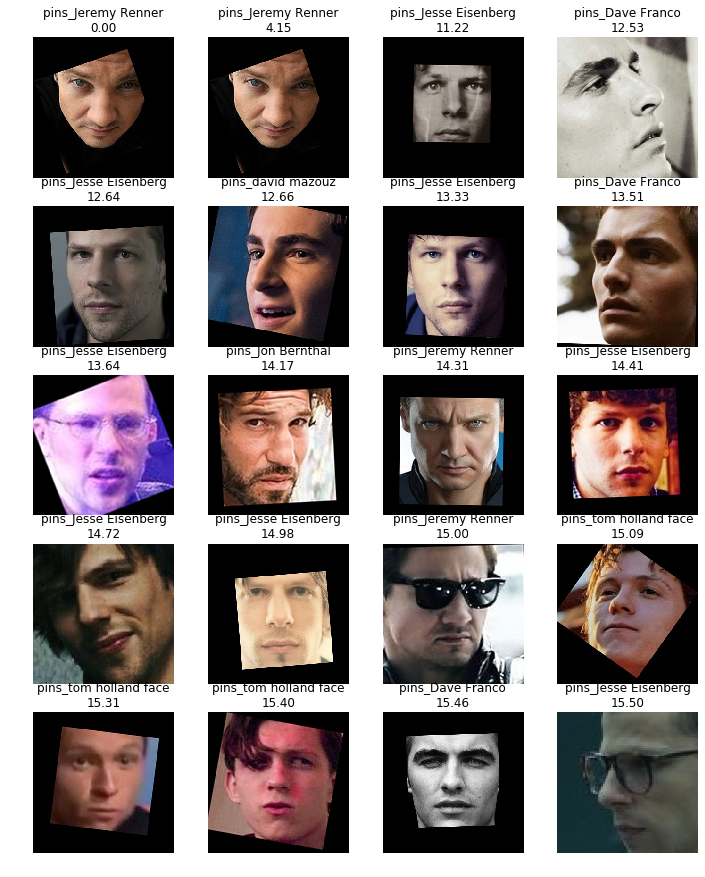

In [54]:
show_distances(
    data_container.train, new_image_index, indices[0].tolist(), distances[0].tolist()
)

### Add Lambda layer

In [57]:
learner.model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.loss = tfa.losses.TripletSemiHardLoss()

In [0]:
lambda_layer = keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))

In [0]:
learner.model = keras.Model(
    inputs=learner.model.input,
    outputs=lambda_layer(learner.model.get_layer('dense_2').output),
)

In [64]:
learner.model.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 74, 74, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 74, 74, 32)   128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 74, 74, 32)   0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [0]:
learner.compile(optimizer=keras.optimizers.Adam, lr=1e-4)

In [66]:
history2 = learner.model.fit(
    data_container.train.data,
    validation_data=data_container.validation.data,
    steps_per_epoch=data_container.train.steps,
    validation_steps=data_container.validation.steps,
    epochs=3,
)

Train for 270 steps, validate for 34 steps
Epoch 1/3
270/270 [==============================] - 216s 800ms/step - loss: 0.7152 - sparse_categorical_accuracy: 0.0149 - sparse_top_2_categorical_accuracy: 0.0273 - val_loss: 0.8044 - val_sparse_categorical_accuracy: 0.0083 - val_sparse_top_2_categorical_accuracy: 0.0239
Epoch 2/3
270/270 [==============================] - 183s 677ms/step - loss: 0.6904 - sparse_categorical_accuracy: 0.0146 - sparse_top_2_categorical_accuracy: 0.0274 - val_loss: 0.8054 - val_sparse_categorical_accuracy: 0.0193 - val_sparse_top_2_categorical_accuracy: 0.0331
Epoch 3/3
270/270 [==============================] - 182s 675ms/step - loss: 0.6519 - sparse_categorical_accuracy: 0.0167 - sparse_top_2_categorical_accuracy: 0.0304 - val_loss: 0.7952 - val_sparse_categorical_accuracy: 0.0147 - val_sparse_top_2_categorical_accuracy: 0.0294


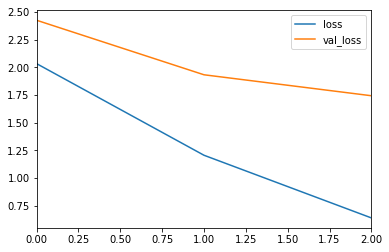

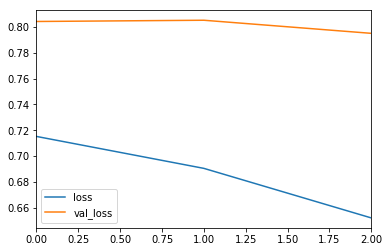

In [67]:
plot_history(history, 'loss')
plot_history(history2, 'loss')

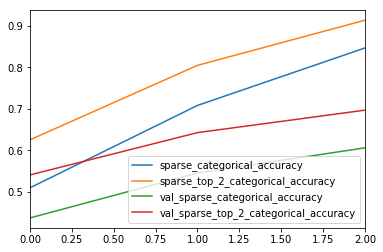

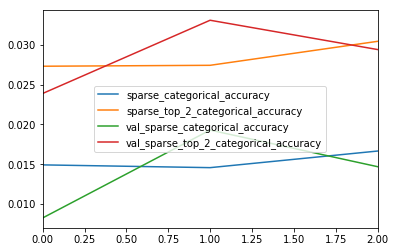

In [68]:
plot_history(history, 'acc')
plot_history(history2, 'acc')

In [0]:
image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline, image_paths=data_container.train.x
)

In [0]:
nbrs = sk.neighbors.NearestNeighbors(n_neighbors=19, algorithm="ball_tree").fit(
    image_embeddings
)

In [0]:
new_image_embeddings = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=data_container.train.x[new_image_index : new_image_index + 1],
)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings)

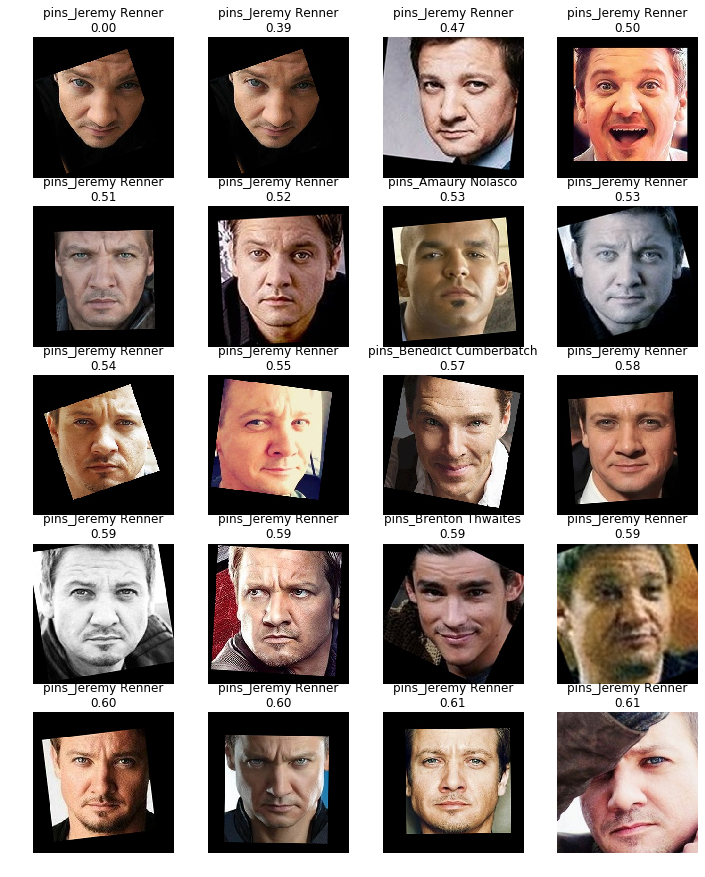

In [73]:
show_distances(
    data_container.train, new_image_index, indices[0].tolist(), distances[0].tolist()
)

### Try on my image

In [0]:
my_image = '/content/gdrive/My Drive/faces/IMG_5959.jpg'

In [81]:
my_image = np.expand_dims(np.array(my_image), 0)
my_image.shape

(1,)

In [0]:
new_image_embeddings_2 = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=my_image,
)

In [0]:
distances, indices = nbrs.kneighbors(new_image_embeddings_2)

In [0]:
def show_distances(
    dataset,
    similar_indices,
    distances,
    cols: int = 4,
    debug: bool = False,
):
    if cols >= len(distances) + 1:
        cols = len(distances) + 1
        rows = 1
    else:
        rows = math.ceil((len(distances) + 1) / cols)

    figsize = (3 * cols, 4 * rows) if debug else (3 * cols, 3 * rows)
    _, ax = plt.subplots(rows, cols, figsize=figsize)

    for i, (x, y, distance) in enumerate(
        zip(
            dataset.x[similar_indices],
            dataset.y[similar_indices],
            [0] + distances,
        )
    ):
        idx = (i // cols, i % cols) if rows > 1 else i % cols
        ax[idx].axis("off")
        ax[idx].imshow(Image.open(x))
        title = f"Label: {y}\nShape: {x.shape}\n" if debug else f"{y}\n{distance:.2f}"
        ax[idx].set_title(title)

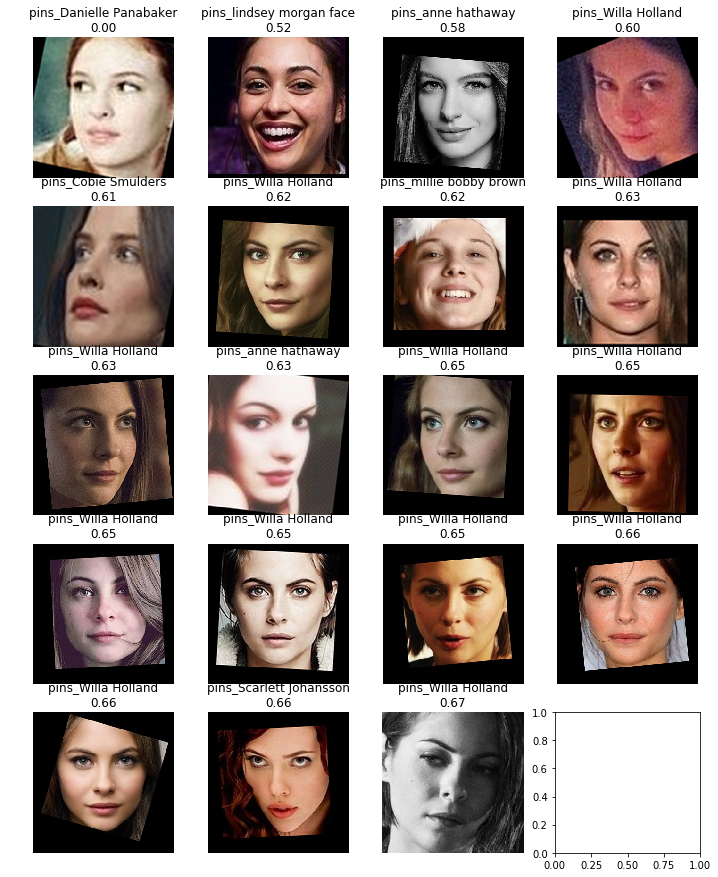

In [84]:
show_distances(
    data_container.train, indices[0].tolist(), distances[0].tolist(),
)

At least no men were found :))

### Try with new images

In [0]:
my_image = '/content/gdrive/My Drive/faces/robin-lord-taylor.jpg'
from_data = '/content/data/faces/PINS/pins_Robin Taylor/Robin Taylor26.jpg'

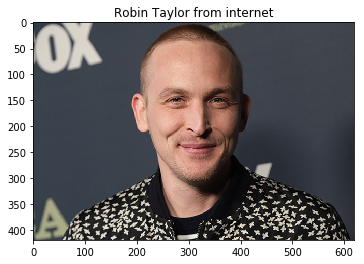

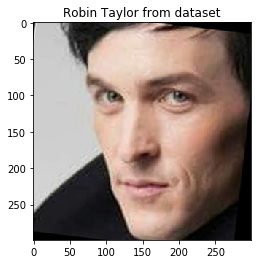

In [119]:
img = Image.open(my_image)
plt.imshow(img)
plt.title('Robin Taylor from internet')
plt.show()

img2 = Image.open(from_data)
plt.imshow(img2)
plt.title('Robin Taylor from dataset')
plt.show()

In [89]:
my_image = np.expand_dims(np.array(my_image), 0)
my_image.shape

(1,)

In [0]:
new_image_embeddings_2 = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=my_image,
)

distances, indices = nbrs.kneighbors(new_image_embeddings_2)

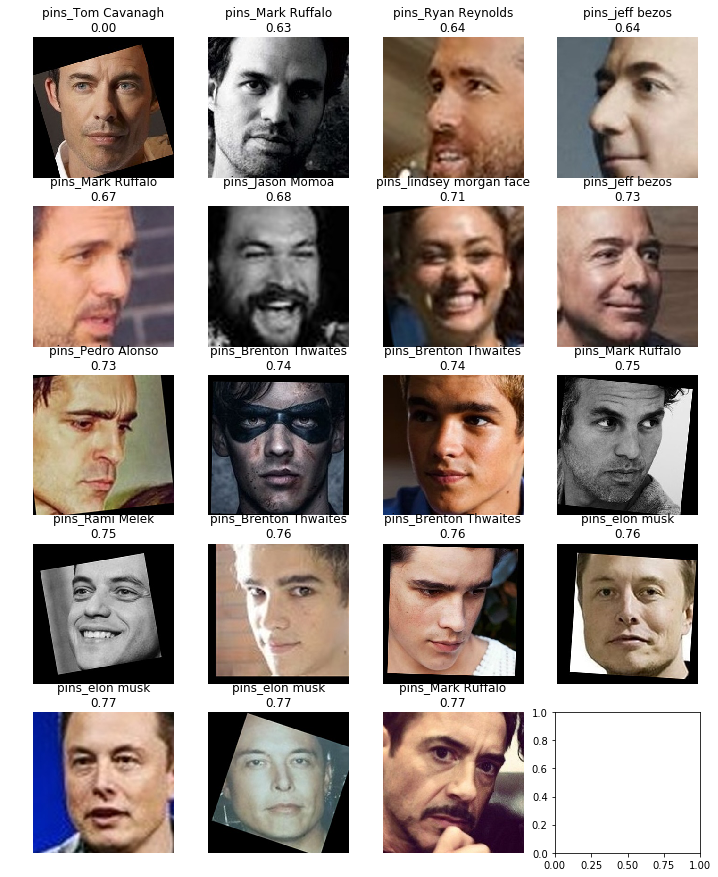

In [92]:
show_distances(
    data_container.train, indices[0].tolist(), distances[0].tolist(),
)

In [0]:
my_image = '/content/gdrive/My Drive/faces/mike_colter.jpg'
from_data = '/content/data/faces/PINS/pins_Mike Colter/Mike Colter124_1313.jpg'

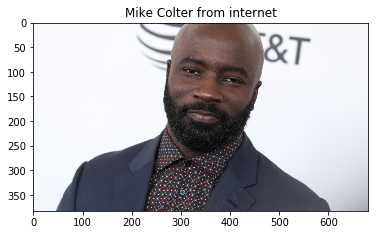

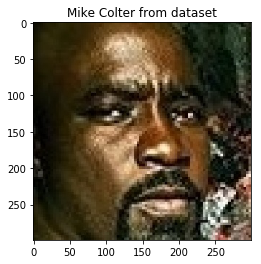

In [117]:
img = Image.open(my_image)
plt.imshow(img)
plt.title('Mike Colter from internet')
plt.show()

img2 = Image.open(from_data)
plt.imshow(img2)
plt.title('Mike Colter from dataset')
plt.show()

In [0]:
my_image = np.expand_dims(np.array(my_image), 0)

new_image_embeddings_2 = learner.predict(
    pipeline=data_container.train.image_pipeline,
    image_paths=my_image,
)

distances, indices = nbrs.kneighbors(new_image_embeddings_2)

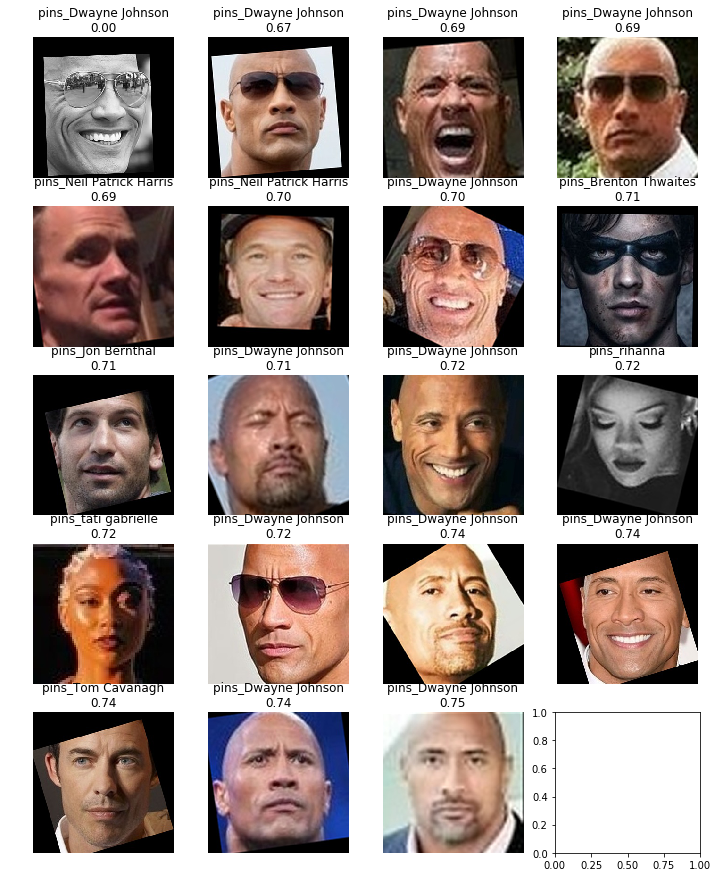

In [96]:
show_distances(
    data_container.train, indices[0].tolist(), distances[0].tolist(),
)